In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import MultipleLocator
import pandas as pd
import os
from scipy import stats
import cv2  
from pyts.image import GramianAngularField
from pyts.image import RecurrencePlot
from PIL import Image 

In [2]:
##获取文件名
file_dir = "./indexdata"
all_file_list = os.listdir(file_dir)
files_num = len(all_file_list) # the number of stocks 

In [3]:
all_file_list[1]

'1SP500.csv'

In [4]:
def Data(path_num):
    path = all_file_list[path_num]
    stk_data = pd.read_csv('./indexdata/'+ path)
#     stk_data = data.iloc[::-1].reset_index(drop=True)
    return stk_data

In [5]:
def Label(path_num,window_size,num):
    a = ['train','valid','test']
    path_label ="./dataset/pre"+str(window_size)+"/"+str(path_num)+"/" + 'label_{}.csv'.format(a[num])
    label = pd.read_csv(path_label,index_col=0)
    return label

In [6]:
def datasplit(stk_data,sequence_length,window_size,percent_training,percent_validing):
    """
    sequence_length: Number of x_i for each y_i
    window_size: Number of y_i 
    """
    # Define the training set`
#     percent_training: float = 0.60
    num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
    training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

    # Define the validation set
#     percent_validing: float = 0.20
    num_validing_samples = int(np.ceil(percent_validing*len(stk_data))) # number of validing samples in int    
    validing_set = stk_data.iloc[num_training_samples:(num_training_samples + num_validing_samples), 4:5].values # Extract the Close values for validing data
   
    #Define the test data
    num_testing_samples: int = len(stk_data) - (num_training_samples + num_validing_samples) # number of test samples in int 
    testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data

    print('Training set shape:', training_set.shape, '\n', 'Validinging set shape:', validing_set.shape, '\n', 'Testing set shape:', testing_set.shape)
    ####Train
#     sequence_length: int = 22 # Full Number of x_i for each y_i
#     window_size: int = 10   #Number of y_i (short)
    x_train = np.array([training_set[i - sequence_length:i, :] for i in range(sequence_length, len(training_set))]).squeeze(axis=2)
    x_train = np.delete(x_train,np.s_[-window_size:],axis = 0)
    y_train = np.array([training_set[i-window_size:i,:] for i in range(sequence_length+window_size, len(training_set))]).squeeze(axis=2)# 2D (num_training_samples, 1)

    ####Valid
    x_valid= np.array([validing_set[i - sequence_length:i, :] for i in range(sequence_length, len(validing_set))]).squeeze(axis=2)
    x_valid = np.delete(x_valid,np.s_[-window_size:],axis = 0)
    y_valid = np.array([validing_set[i-window_size:i,:] for i in range(sequence_length+window_size, len(validing_set))]).squeeze(axis=2)# 2D (num_training_samples, 1)

    ###Test
    x_test = np.array([testing_set[i - sequence_length:i, :] for i in range(sequence_length, len(testing_set))]).squeeze(axis=2)
    x_test = np.delete(x_test,np.s_[-window_size:],axis = 0)
    y_test = np.array([testing_set[i-window_size:i,:] for i in range(sequence_length+window_size, len(testing_set))]).squeeze(axis=2)# 2D (num_training_samples, 1)

    print('x_train,y_train,x_valid,y_valid,x_test,y_test:',x_train.shape,y_train.shape,x_valid.shape,y_valid.shape,x_test.shape,y_test.shape)
    return x_train,y_train,x_valid,y_valid,x_test,y_test

rateline: $$\omega * (\frac{(1+rate)^{(window \_ size+1)}-(1+rate)}{rate\times window \_ size} - 1)$$

def get_rateline(rate,window_size):
    a = (1+rate)**(window_size+1)-(1+rate)
    b = rate*window_size
    w = 0.2
    rateline = (a/b -1)*w 
    return rateline

In [7]:
def get_rateline(rate,window_size):
    a = (1+rate)**(window_size+1)-(1+rate)
    b = rate*window_size
    w1 = 0.2
    rateline1 = (a/b -1)*w1 
    w2 = 0.2
    rateline2= (a/b -1)*w2
    return rateline1,rateline2

In [11]:
def clean_data(window_size,y_train,label):
    tmp = pd.DataFrame(np.tile(y_train[:, 0].reshape(-1,1), (1, window_size)))
    y_price = y_train / tmp - 1 # scaling
    rate = 0.005
    rateline1,rateline2 = get_rateline(rate,window_size) #(1+window_size)*window_size/2*window_size
    pos_index = []
    pos_rate = []
    neg_index = []
    neg_rate = []
    hod_index = []
    hod_rate = []
    clean_labels = []
    for i in range(len(y_price)):
        rate = y_price.iloc[i,:]
        m_rate = y_price.iloc[i,:].mean()
        if ((np.array(rate) >=0).all() or m_rate >= rateline1) and label[i]==2:
            clean_label = 2
            pos_index.append(i)
            pos_rate.append(rate)
        elif ((np.array(rate) <= 0).all() or m_rate <= -rateline2) and label[i]==0:
            clean_label = 0
            neg_index.append(i)
            neg_rate.append(rate)
        else:  
            clean_label = 1
            hod_index.append(i)
            hod_rate.append(rate)
    
        clean_labels.append(clean_label)
    print("length of pos_index:",len(pos_index),"length of neg_index:",len(neg_index),"length of hod_index:",len(hod_index)) #True代表非空
    pos_rate = pd.DataFrame(pos_rate)
    neg_rate = pd.DataFrame(neg_rate)
    hod_rate = pd.DataFrame(hod_rate)
    return pos_index,pos_rate,neg_index,neg_rate,hod_index,hod_rate,clean_labels

In [12]:
def plt_imshowY(window_size,title,y_price):
    baseline = 0.005*int(window_size)*2
    plt.figure(figsize=(6,6))
    plt.plot(np.arange(0,window_size), y_price)
    plt.xlim([0,window_size-1])
    plt.ylim([-baseline,baseline])
    plt.title(title)
    plt.fill_between(np.arange(0,window_size), y_price, color='k')
    plt.show()

In [13]:
def to_csv(path_num,window_size,label,clean_labels,num):# num=0;1;2
    a = ['label_train','label_valid','label_test']
    b = ['train','valid','test']
    c = ['picname_train','picname_valid','picname_test']
    filename_all = pd.DataFrame(label[c[num]],columns=[c[num]])
    path_label ="./dataset/pre"+str(window_size)+"/"+str(path_num)+"/" + 'cleanlabel_{}.csv'.format(b[num])
    clean_data = pd.DataFrame(clean_labels,columns=[a[num]])
    label_data = pd.concat([filename_all,clean_data],axis=1)
    label_data.reset_index(inplace=True,drop=False)
    #将DataFrame存储为csv,index表示是否显示行名，default=True
    label_data.to_csv(path_label,index=False,sep=',')

In [44]:
path_num = 1##8,34,35,42,49
window_size = 15
sequence_length=30
num =1
t = ['label_train','label_valid','label_test']

In [45]:
data = Data(path_num)
data.drop(data.tail(window_size).index,inplace=True) # 从尾部去掉n行
x_train,y_train,x_valid,y_valid,x_test,y_test = datasplit(data,sequence_length,window_size,percent_training=0.6,percent_validing=0.2)

Training set shape: (1487, 1) 
 Validinging set shape: (496, 1) 
 Testing set shape: (495, 1)
x_train,y_train,x_valid,y_valid,x_test,y_test: (1442, 30) (1442, 15) (451, 30) (451, 15) (450, 30) (450, 15)


In [46]:
label = Label(path_num,window_size,num)

In [47]:
label

,picname_valid,label_valid
0,1000000.png,1.0
1,1000001.png,1.0
2,1000002.png,1.0
3,1000003.png,2.0
4,1000004.png,1.0
...,...,...
446,100000446.png,2.0
447,100000447.png,1.0
448,100000448.png,1.0
449,100000449.png,1.0


In [48]:
pos_index,pos_rate,neg_index,neg_rate,hod_index,hod_rate,clean_labels = clean_data(window_size,y_valid,label[t[num]])

length of pos_index: 74 length of neg_index: 11 length of hod_index: 366


In [49]:
to_csv(path_num,window_size,label,clean_labels,num)#lenth=60, num=0;1;2

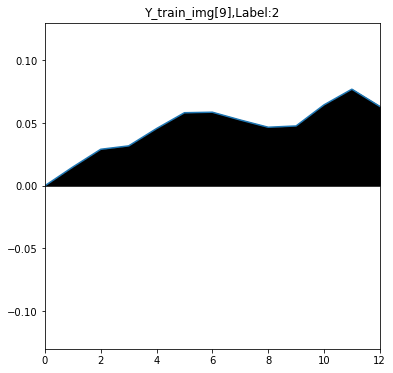

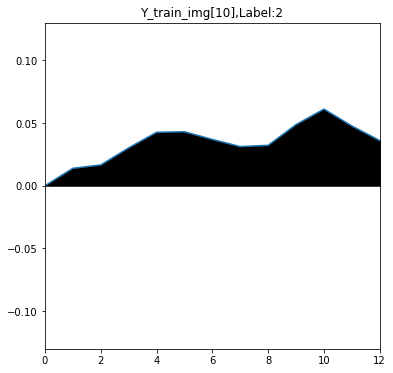

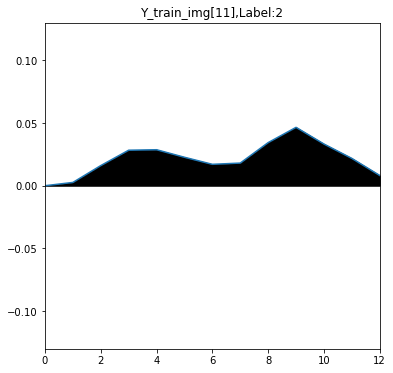

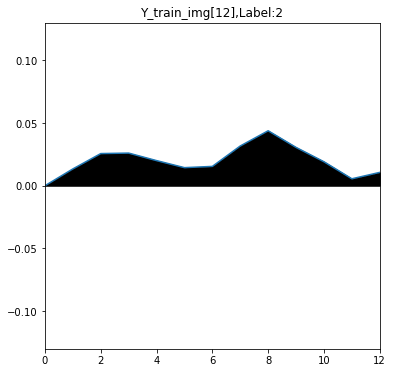

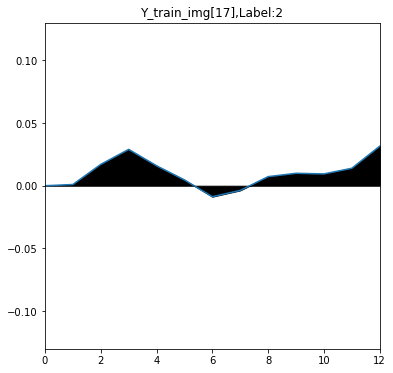

...

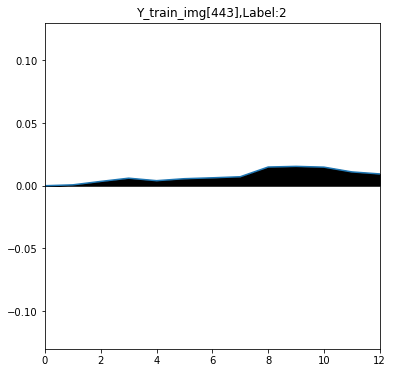

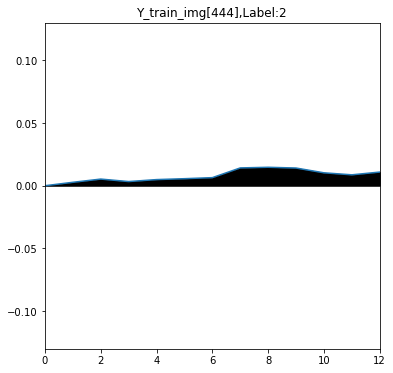

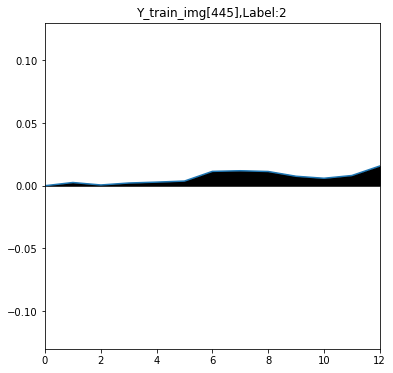

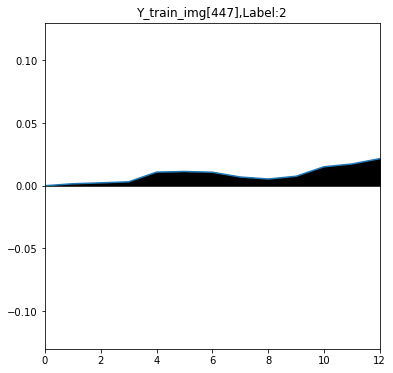

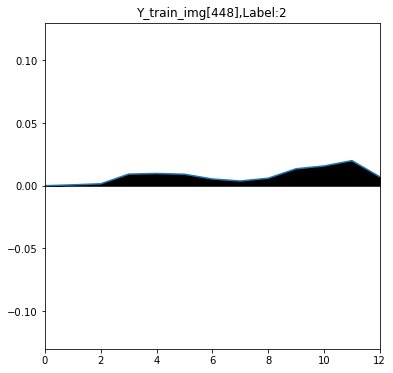

In [69]:
for i in range(len(pos_rate)):
    plt_imshowY(window_size,"Y_train_img[{}],Label:{}".format(pos_index[i],pd.DataFrame(clean_labels)[0][pos_index[i]]), pos_rate.iloc[i,:])

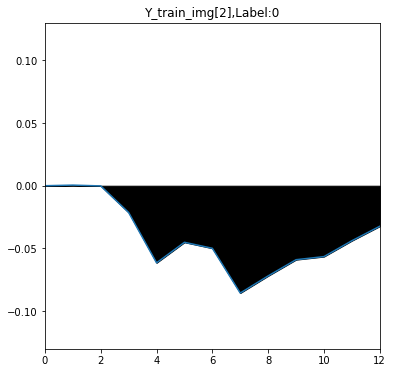

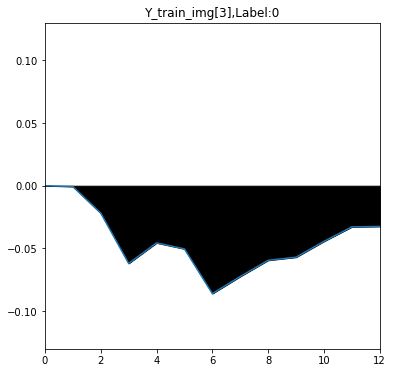

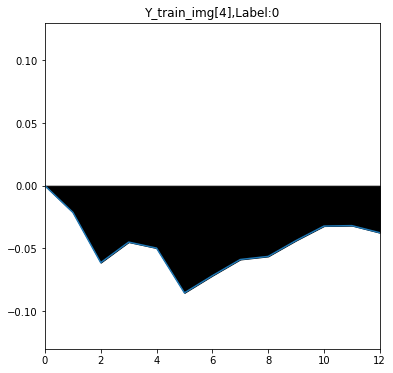

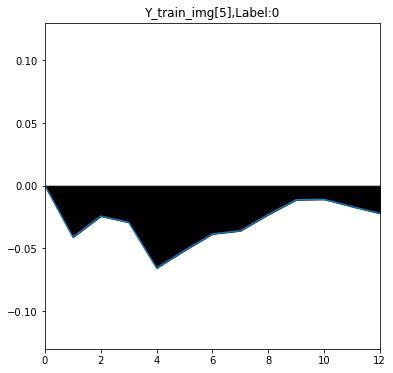

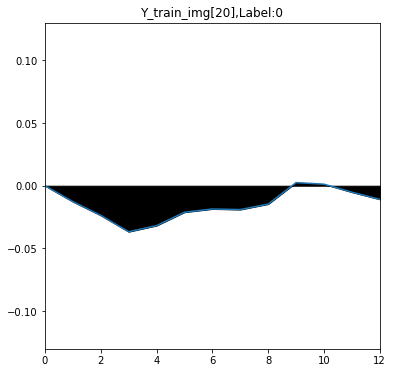

...

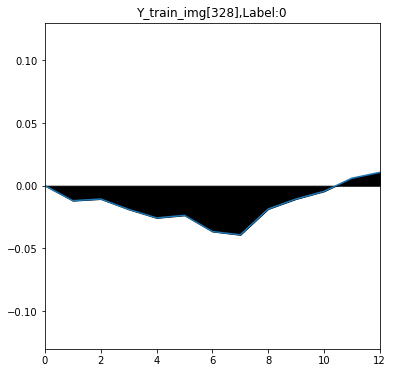

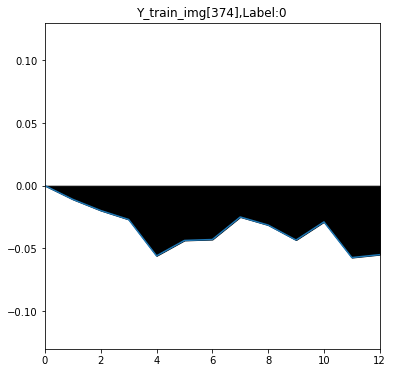

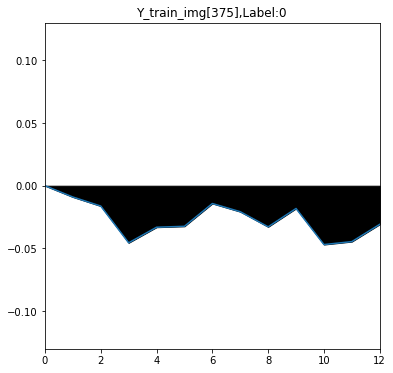

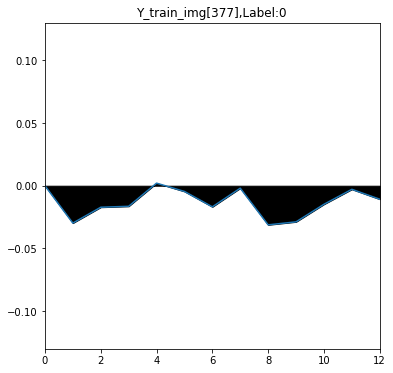

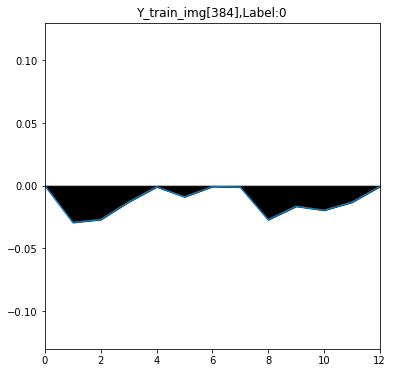

In [58]:
for i in range(len(neg_rate)):
    plt_imshowY(window_size,"Y_train_img[{}],Label:{}".format(neg_index[i],pd.DataFrame(clean_labels)[0][neg_index[i]]), neg_rate.iloc[i,:])

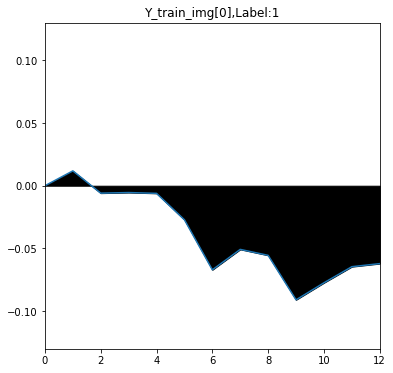

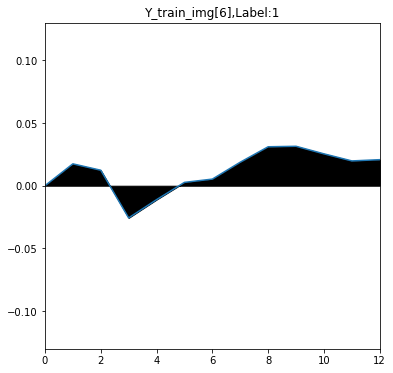

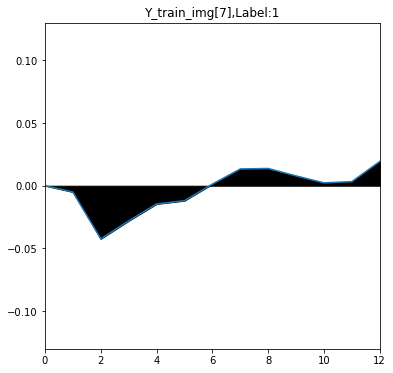

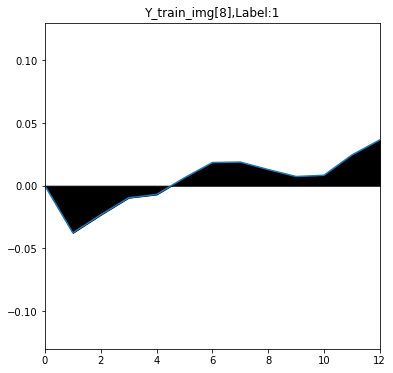

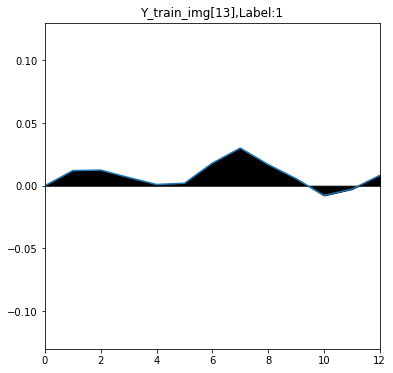

...

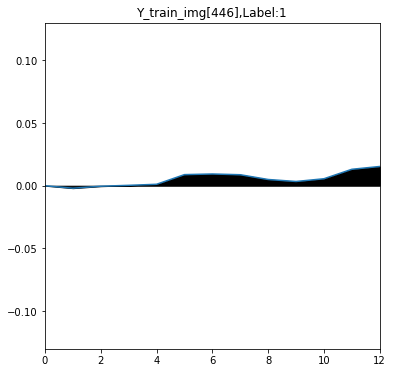

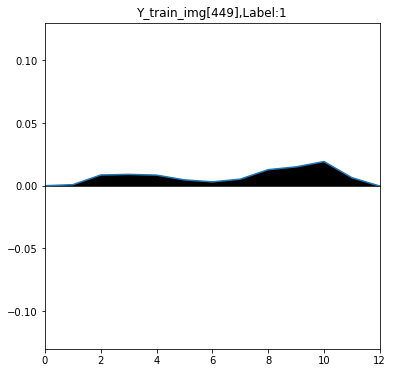

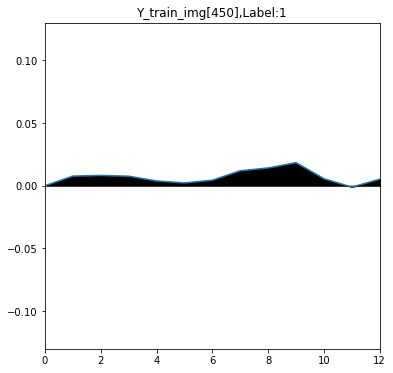

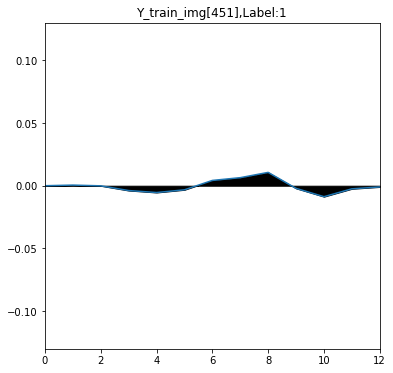

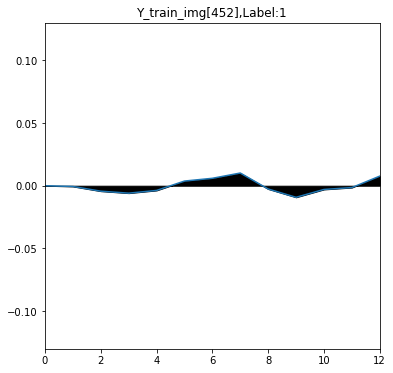

In [70]:
for i in range(len(hod_rate)):
    plt_imshowY(window_size,"Y_train_img[{}],Label:{}".format(hod_index[i],pd.DataFrame(clean_labels)[0][hod_index[i]]), hod_rate.iloc[i,:])

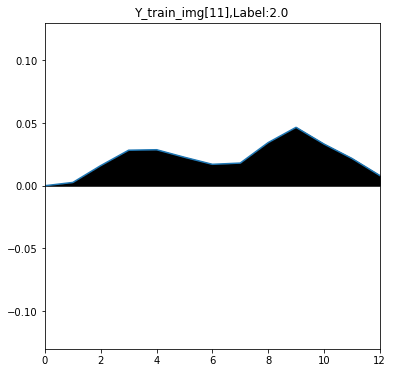

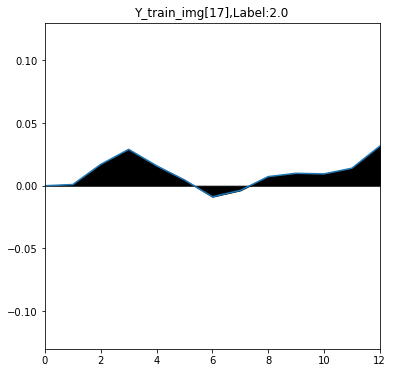

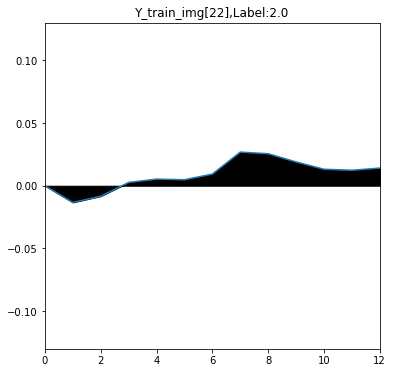

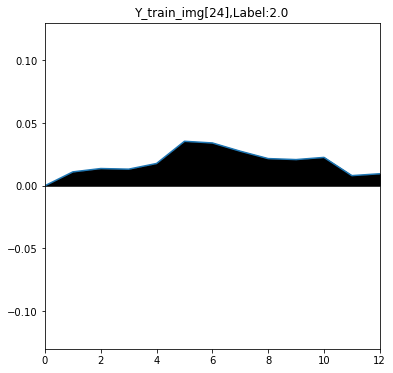

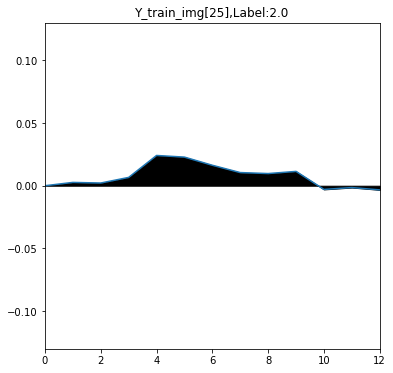

...

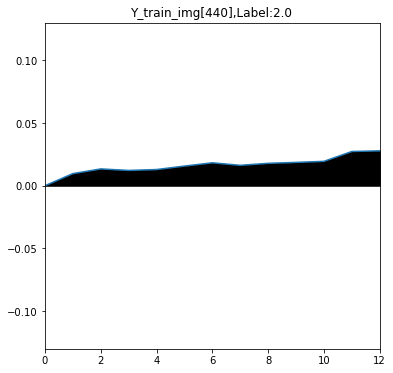

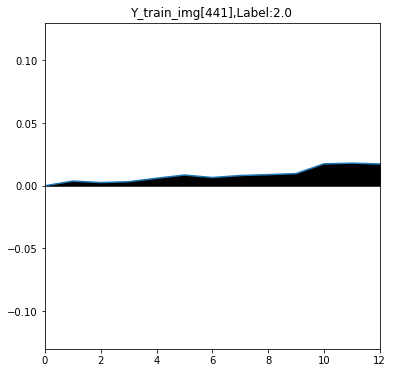

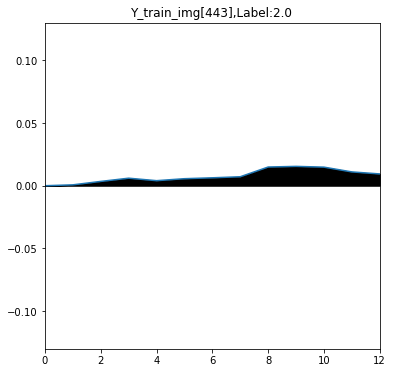

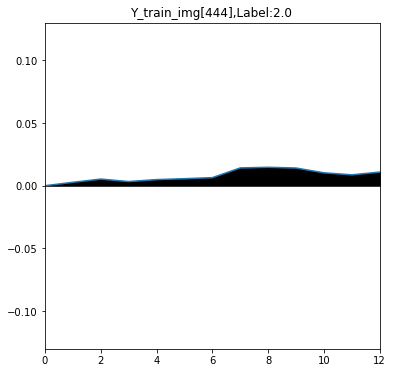

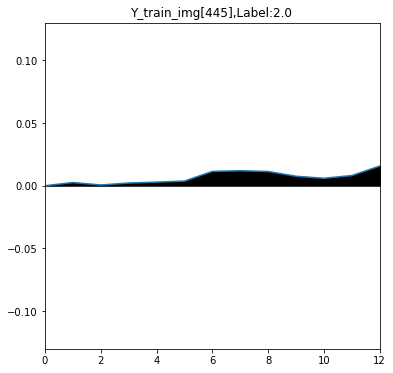

In [56]:
for i in range(len(pos_rate)):
    plt_imshowY(window_size,"Y_train_img[{}],Label:{}".format(pos_index[i],label[t[num]][pos_index[i]]), pos_rate.iloc[i,:])

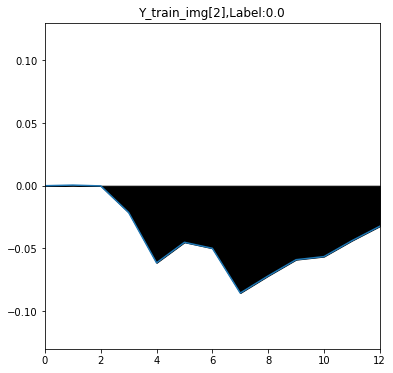

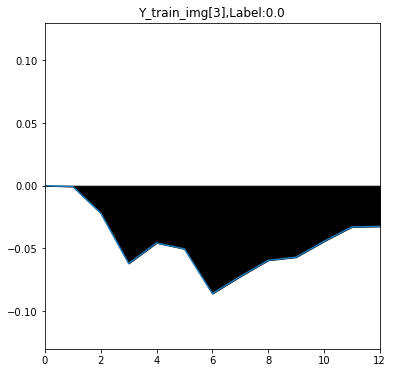

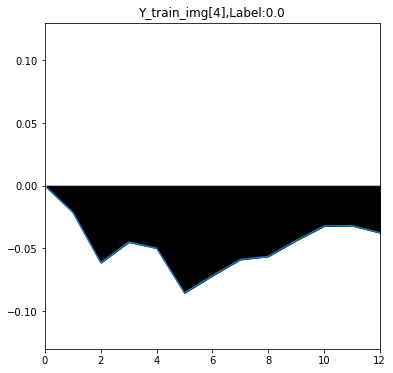

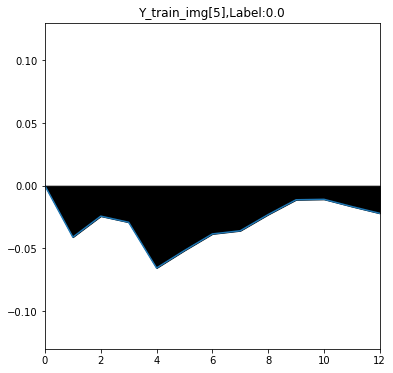

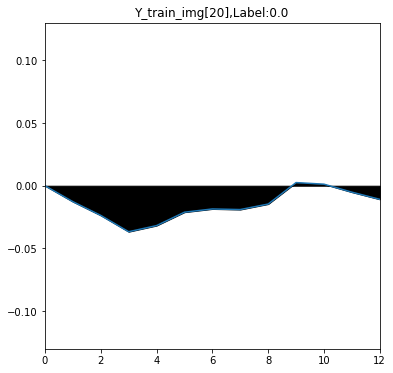

...

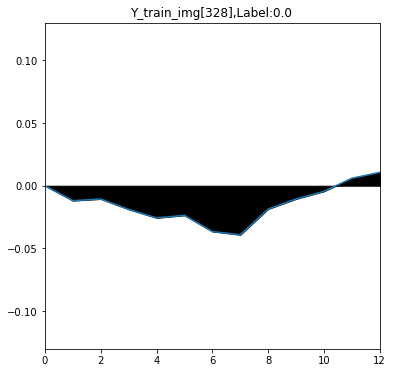

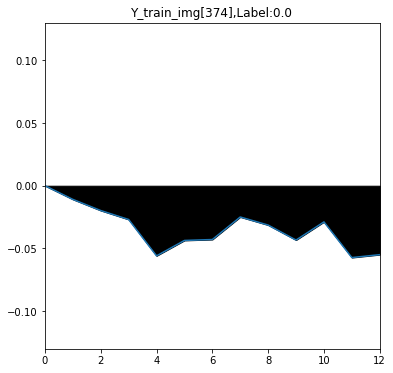

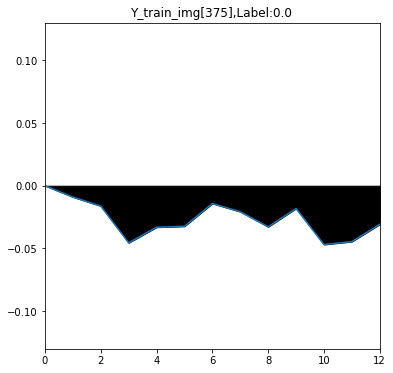

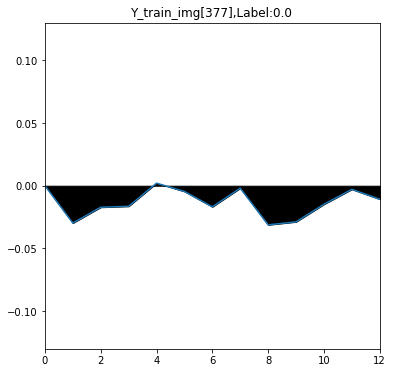

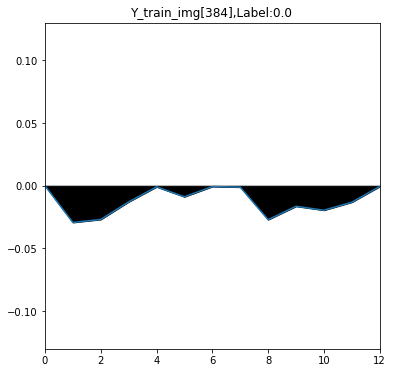

In [48]:
for i in range(len(neg_rate)):
    plt_imshowY(window_size,"Y_train_img[{}],Label:{}".format(neg_index[i],label[t[num]][neg_index[i]]), neg_rate.iloc[i,:])

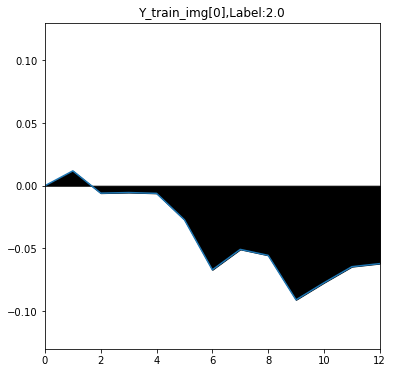

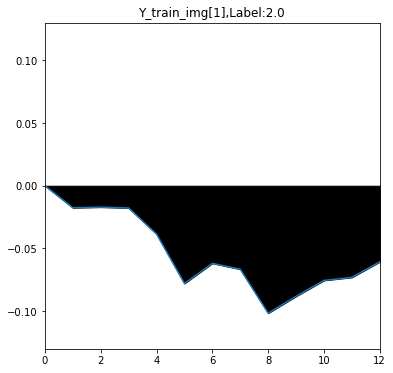

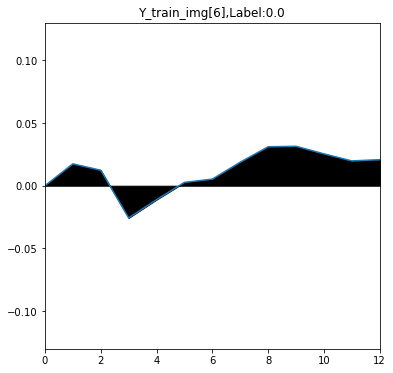

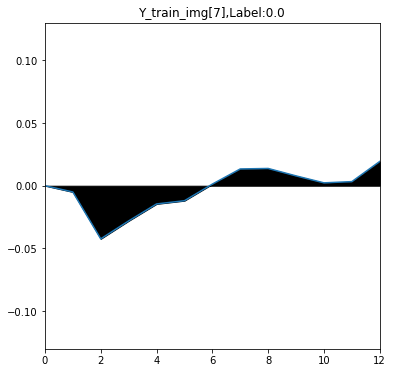

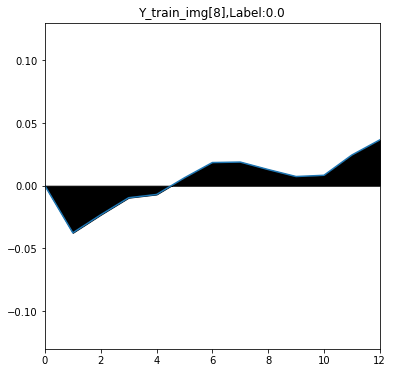

...

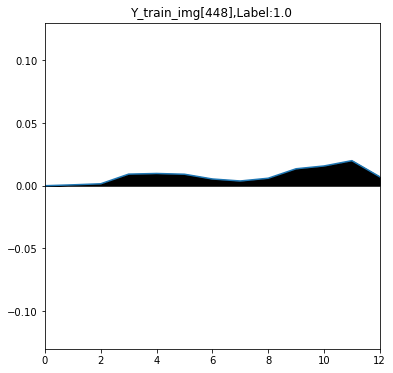

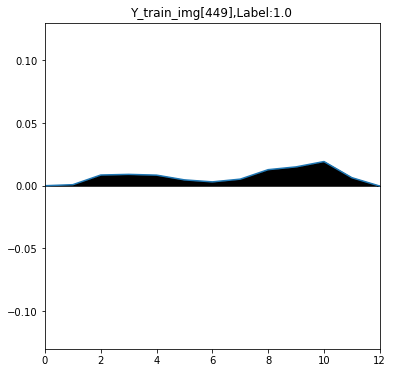

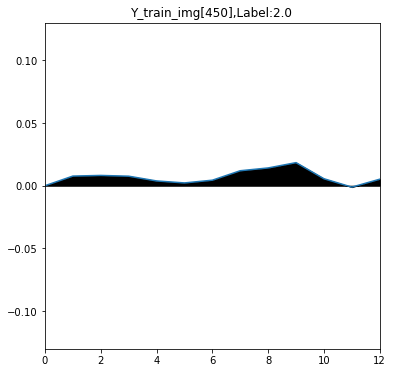

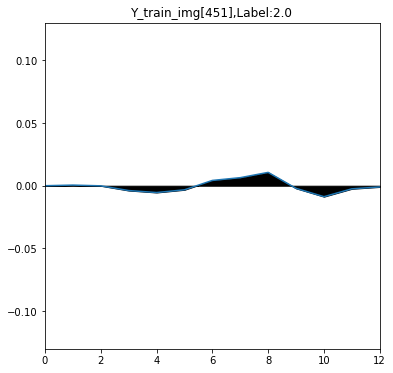

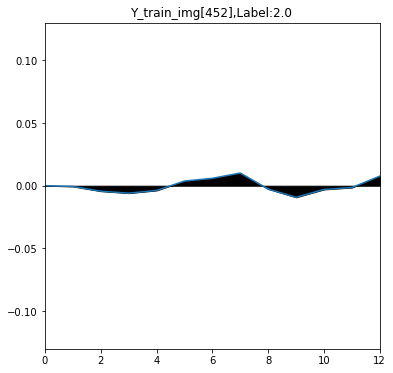

In [49]:
for i in range(len(hod_rate)):
    plt_imshowY(window_size,"Y_train_img[{}],Label:{}".format(hod_index[i],label[t[num]][hod_index[i]]), hod_rate.iloc[i,:])